Example Python Jupyter Notebook that demonstrates:
- Connecting to a Microsoft SQL Server
- Web scraping data from different pages in a website within a loop
- Cleaning scraped data to get only the information required

The problem:
Lego sets only identify which minifigures are included on the box and not in the instructions. Third party websites exist which include minifigure breakdowns of the sets based on their Lego ID numbers. Using a list of sets owned, it is possible to scrape such websites to collate a list of all the owned minifigures in a particular collection.

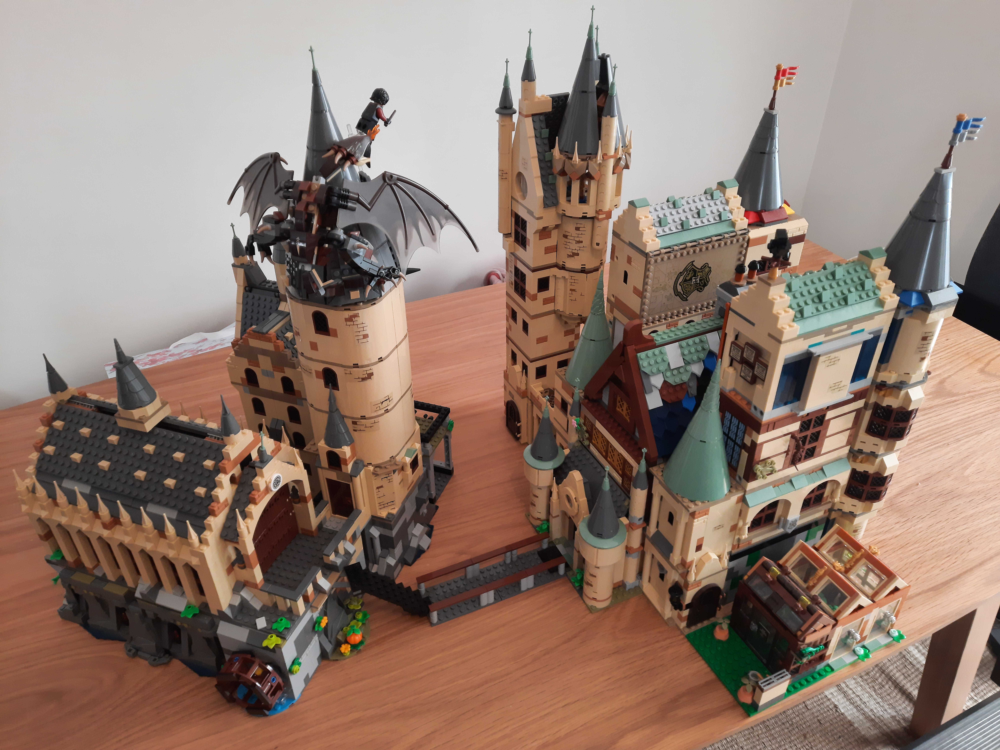

In [1]:
# Load SQL Magic
%load_ext sql

In [3]:
# Import required modules
import pandas as pd
import pyodbc
import sqlalchemy
import urllib
import requests
from bs4 import BeautifulSoup
from datetime import datetime

In [3]:
# Establish database connection
connection_str = "DRIVER={SQL SERVER};SERVER=LAPTOP-BJU2VQE0\SIMPLESERVER;DATABASE=Lego;TRUSTED_CONNECTION=YES"
connection_str_quoted = urllib.parse.quote_plus(connection_str)
connection_uri = 'mssql+pyodbc:///?odbc_connect={}'.format(connection_str_quoted)

%sql {connection_uri}

In [69]:
filename = "C:\\Users\\Daniel Underwood\\Documents\\HPAlgo\\sets.csv"
sets_df = pd.read_csv(filename)
sets_df.head()

,Set_Number,Set_Name,Quantity
0,40419,Hogwarts Students Acc. Set,2
1,76389,Hogwarts Chamber of Secrets,2
2,75980,Attack on the Burrow,1
3,75969,Hogwarts Astronomy Tower,2
4,75948,Hogwarts Clock Tower,2


In [68]:
url = "https://www.bricklink.com/catalogItemInv.asp?S=<set_no>-1&viewItemType=M"
#User-agent headers
headers = {'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_5) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.102 Safari/537.36'}

web_data = pd.DataFrame(columns=["Figure_ID","Name","Quantity","Set_Number"])
ignore_rows = ['Regular Items:','Minifigures:','Alernative Items:','Description']

for i in range(0,len(sets_df)):

    set_no = sets_df.iloc[i]['Set_Number']

    #replace the <set_no> text with lego set number in the url
    new_url = url.replace("<set_no>",str(set_no))
        
    # Get the contents of the webpage in text format and store in a variable called data
    data = requests.get(new_url, headers=headers).text

    # Parse using BeautifulSoup to make the data more manageable
    soup = BeautifulSoup(data,"html.parser")

    # Find all the tables in the page
    tables = soup.find_all('table')

    #Find the table with the minifigure information in
    for index,td in enumerate(tables):
        if ("Image" in str(td)):
            table_index = index
    
    for row in tables[table_index].find_all("tr"):
        col = row.find_all("td")
        if (col != [] and col[0].text.strip() not in ignore_rows and len(col) >=5):
            if col[3].text.strip() != "Description":

                raw_id = col[2].text.strip()
                raw_id_pos = raw_id.find(' (Inv)')            
                if raw_id_pos == -1:
                    figureid = raw_id
                else:
                    figureid = raw_id[0:raw_id_pos]    

                raw_name = col[3].text.strip()
                raw_name_pos = raw_name.find('Catalog')
                if raw_name_pos == -1:
                    name = raw_name
                else:
                    name = raw_name[0:raw_name.find('Catalog')]           

                quantity = int(col[1].text.strip())            

                new_web_data = pd.DataFrame({"Figure_ID":figureid,"Name":name,"Quantity":quantity,"Set_Number":set_no},index = [0])
                web_data = pd.concat([web_data,new_web_data],axis=0)

web_data.set_index("Figure_ID",inplace=True)
web_data.to_csv("minifigures.csv")
web_data.head()

,Name,Quantity,Set_Number
Figure_ID,,,
hp223,Cho Chang,1,40419
hp221,"Draco Malfoy, Slytherin Sweater, Black Legs",1,40419
hp222,Hannah Abbott,1,40419
hp220,"Harry Potter, Gryffindor Sweater, Black Legs",1,40419
hp303,"Albus Dumbledore, Magenta Robe",1,76389
